<a href="https://colab.research.google.com/github/lnsithol/Samples/blob/master/narrative_analysis_001.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**NLP Twitter Analysis Project**
#**Objective**: Analyze tweets/retweets for sentiment, keyphrases, and trends
# - Dataset: Twitter data with metadata (dates, authors, content, metrics)
# - Techniques: Sentiment analysis, NER, Keyphrase extraction
# - Models: BERT (transformers)

In [2]:
# Install all required libraries
!pip install -q pandas numpy regex transformers sentence-transformers umap-learn hdbscan matplotlib seaborn networkx python-louvain geopy wordcloud prophet detoxify

# Import libraries
import pandas as pd
import numpy as np
import regex as re
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
from community import community_louvain
from prophet import Prophet
from detoxify import Detoxify
from sentence_transformers import SentenceTransformer
import umap.umap_ as umap
import hdbscan
from wordcloud import WordCloud
from geopy.geocoders import Nominatim

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 88.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 71.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 41.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 72.0 MB/s eta 0:00:00


In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [20]:
# Detect the encoding of the file
import chardet

with open('/content/drive/MyDrive/nlp/Zlatti_71_ZA_Jan.csv', 'rb') as f:
    result = chardet.detect(f.read())
    print("Detected Encoding:", result['encoding'])

Detected Encoding: Windows-1252


In [39]:
# Load dataset
df = pd.read_csv('/content/drive/MyDrive/nlp/Zlatti_71_ZA_Jan.csv', encoding='cp1252')


# Check available columns
print("Dataset Columns:", df.columns.tolist())

# Clean content: Remove RT handles, URLs, and handle Unicode properly
def clean_content(text):
    if pd.isna(text):  # Handle missing values
        return ""

    # Ensure text is treated as Unicode
    if isinstance(text, bytes):
        text = text.decode('utf-8', errors='ignore')

    # Remove RT handles
    text = re.sub(r'^RT\s*@\w+:\s*', '', text)  # Remove RT prefixes

    # Remove URLs
    text = re.sub(r'https?://\S+', '', text)    # Remove URLs

    # Replace unwanted symbols (e.g., ▪️) with spaces
    text = re.sub(r'[▪️•]', ' ', text)  # Add more symbols if needed

    # Remove sequences of ?
    text = re.sub(r'\?+', '', text)

    # Normalize whitespace
    text = re.sub(r'\s+', ' ', text).strip()


    return text

# Use 'Hit Sentence' column for content
df['clean_content'] = df['Hit Sentence'].apply(clean_content)

# Print basic EDA
print("Dataset Shape:", df.shape)
print("\nMissing Values:\n", df.isnull().sum())

# Print uncleaned and cleaned samples side by side
sample_df = df[['Hit Sentence', 'clean_content']].head()

# Improved display function
def display_samples(sample_df):
    print("\nSample Uncleaned vs Cleaned Content:")
    print("-" * 120)  # Wider separator line
    print(f"{'Uncleaned Content':<60} | {'Cleaned Content':<60}")
    print("-" * 120)  # Wider separator line
    for _, row in sample_df.iterrows():
        print(f"{row['Hit Sentence'][:60]:<60} | {row['clean_content'][:60]:<60}")
    print("-" * 120)  # Wider separator line

# Display the samples
display_samples(sample_df)

Dataset Columns: ['Date', 'Time', 'Document ID', 'URL', 'Input Name', 'Keywords', 'Information Type', 'Source Type', 'Source Name', 'Source Domain', 'Content Type', 'Author Name', 'Author Handle', 'Title', 'Opening Text', 'Hit Sentence', 'Image', 'Hashtags', 'Links', 'Country', 'Region', 'State', 'City', 'Language', 'Sentiment', 'Keyphrases', 'Reach', 'AVE', 'Social Echo', 'Editorial Echo', 'Engagement', 'Shares', 'Quotes', 'Likes', 'Replies', 'Reposts', 'Comments', 'Reactions', 'Views', 'Estimated Views', 'Document Tags', 'Custom Categories']
Dataset Shape: (1633, 43)

Missing Values:
 Date                    0
Time                    0
Document ID             0
URL                     0
Input Name              0
Keywords                0
Information Type        0
Source Type             0
Source Name             0
Source Domain           0
Content Type            0
Author Name             0
Author Handle           0
Title                1633
Opening Text            0
Hit Sentence    

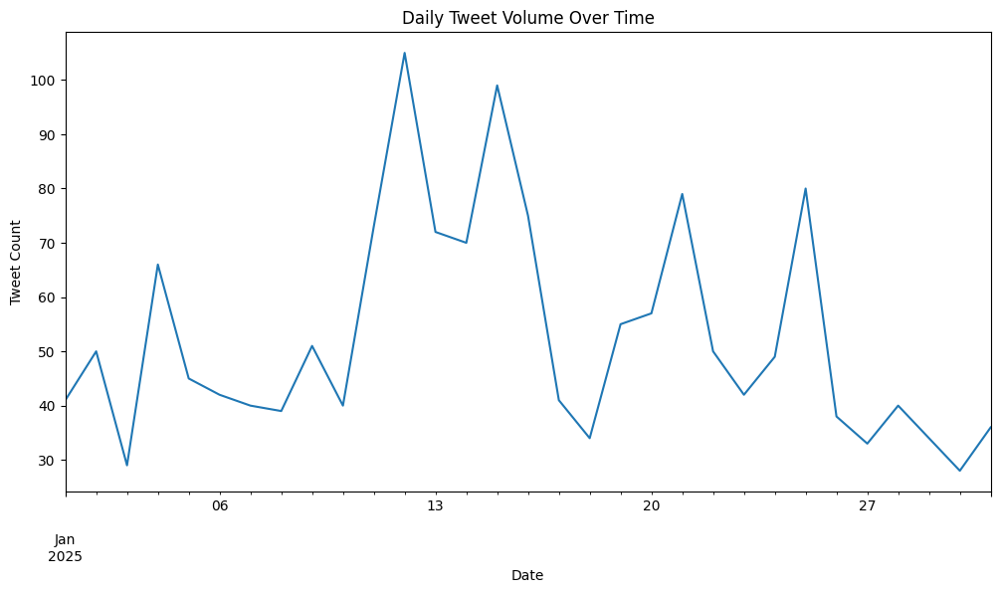

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 23.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnn_8vntz/xm0a7jdj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnn_8vntz/zlp3rtxw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=54942', 'data', 'file=/tmp/tmpnn_8vntz/xm0a7jdj.json', 'init=/tmp/tmpnn_8vntz/zlp3rtxw.json', 'output', 'file=/tmp/tmpnn_8vntz/prophet_model9fyid9x0/prophet_model-20250308090147.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
09:01:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:01:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:

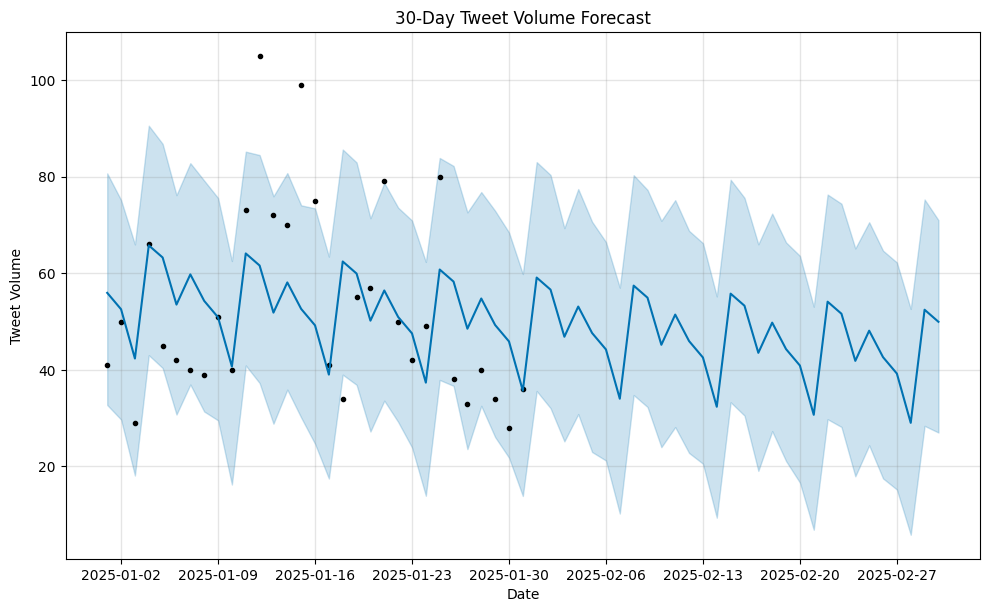

In [41]:
# Prepare time series data
df['date'] = pd.to_datetime(df['Date'] + ' ' + df['Time'])
time_series = df.groupby([pd.Grouper(key='date', freq='D')]).size()

# Plot raw time series
plt.figure(figsize=(12, 6))
time_series.plot(title='Daily Tweet Volume Over Time')
plt.xlabel('Date')
plt.ylabel('Tweet Count')
plt.show()

# Forecast with Prophet
model = Prophet()
model.fit(time_series.reset_index().rename(columns={'date': 'ds', 0: 'y'}))
future = model.make_future_dataframe(periods=30)
forecast = model.predict(future)

# Plot forecast
fig = model.plot(forecast, xlabel='Date', ylabel='Tweet Volume')
plt.title('30-Day Tweet Volume Forecast')
plt.show()

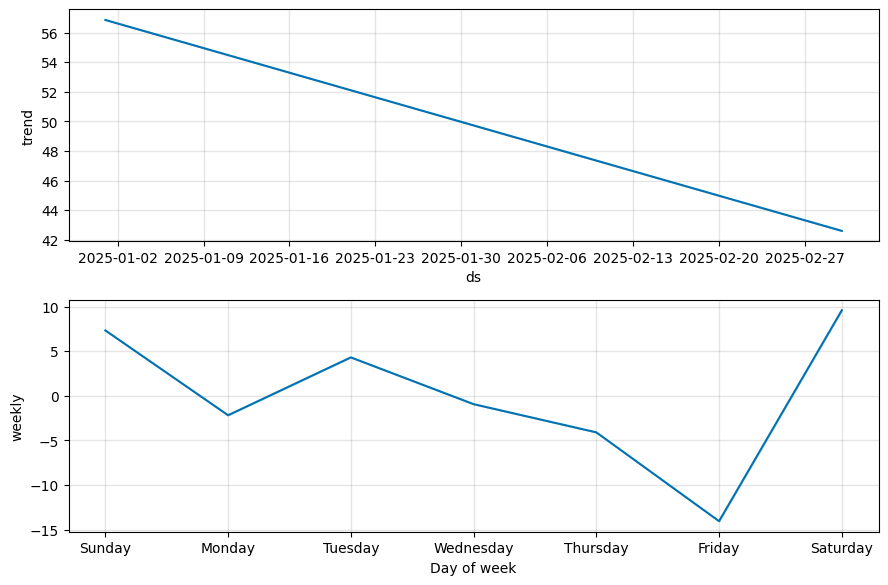

In [42]:
# Plot trend and seasonality components
fig2 = model.plot_components(forecast)
plt.show()

In [45]:
import networkx as nx
from community import community_louvain

# Build retweet network
G = nx.Graph()

for _, row in df.iterrows():
    source = row['Author Handle']  # The user who posted the tweet
    targets = re.findall(r'@(\w+)', row['Hit Sentence'])  # Users mentioned in the tweet (retweets/quotes)

    # Add edges between the source and targets
    for target in targets:
        G.add_edge(source, target)

# Print basic network stats
print("Number of Nodes (Users):", G.number_of_nodes())
print("Number of Edges (Retweets/Quotes):", G.number_of_edges())

Number of Nodes (Users): 322
Number of Edges (Retweets/Quotes): 368


In [46]:
# Detect communities using Louvain algorithm
partition = community_louvain.best_partition(G)

# Add community information to the DataFrame
df['community'] = df['Author Handle'].map(partition)

# Print community stats
community_counts = pd.Series(partition).value_counts()
print("\nCommunity Distribution:")
print(community_counts)


Community Distribution:
0    261
2     41
5      4
9      3
8      3
4      2
6      2
7      2
1      2
3      2
Name: count, dtype: int64


In [53]:
# Detect communities using Louvain algorithm
partition = community_louvain.best_partition(G)

# Add community information to the DataFrame
df['community'] = df['Author Handle'].map(partition)

# Print community stats
community_counts = pd.Series(partition).value_counts()
print("\nCommunity Distribution:")
print(community_counts)

# Print basic network stats
print("\nNumber of Nodes (Users):", G.number_of_nodes())
print("Number of Edges (Retweets/Quotes):", G.number_of_edges())

# Largest community
largest_community = community_counts.idxmax()
largest_community_size = community_counts.max()
print("\nLargest Community:")
print(f"Community ID: {largest_community}, Size: {largest_community_size}")

# Average degree
average_degree = sum(dict(G.degree()).values()) / G.number_of_nodes()
print("\nAverage Degree:", average_degree)

# Network density
density = nx.density(G)
print("\nNetwork Density:", density)

# Average clustering coefficient
clustering_coefficient = nx.average_clustering(G)
print("\nAverage Clustering Coefficient:", clustering_coefficient)

# Diameter and average path length
if nx.is_connected(G):
    diameter = nx.diameter(G)
    avg_path_length = nx.average_shortest_path_length(G)
else:
    largest_component = max(nx.connected_components(G), key=len)
    subgraph = G.subgraph(largest_component)
    diameter = nx.diameter(subgraph)
    avg_path_length = nx.average_shortest_path_length(subgraph)
print("\nDiameter:", diameter)
print("Average Path Length:", avg_path_length)

# Centrality measures
degree_centrality = nx.degree_centrality(G)
betweenness_centrality = nx.betweenness_centrality(G)
eigenvector_centrality = nx.eigenvector_centrality(G)

top_degree = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)[:5]
top_betweenness = sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)[:5]
top_eigenvector = sorted(eigenvector_centrality.items(), key=lambda x: x[1], reverse=True)[:5]

print("\nTop 5 Users by Degree Centrality:")
print(top_degree)

print("\nTop 5 Users by Betweenness Centrality:")
print(top_betweenness)

print("\nTop 5 Users by Eigenvector Centrality:")
print(top_eigenvector)

# Modularity
modularity = community_louvain.modularity(partition, G)
print("\nModularity:", modularity)

# Number of connected components
num_components = nx.number_connected_components(G)
print("\nNumber of Connected Components:", num_components)


Community Distribution:
0    261
2     41
6      4
9      3
8      3
3      2
5      2
7      2
1      2
4      2
Name: count, dtype: int64

Number of Nodes (Users): 322
Number of Edges (Retweets/Quotes): 368

Largest Community:
Community ID: 0, Size: 261

Average Degree: 2.2857142857142856

Network Density: 0.007120605251446373

Average Clustering Coefficient: 0.0

Diameter: 4
Average Path Length: 2.0842475958282543

Top 5 Users by Degree Centrality:
[('Zlatti_71', 0.9532710280373832), ('ukraine_watch', 0.08099688473520249), ('ukr_leaks_eng', 0.06542056074766354), ('@irfaanbuckus0', 0.012461059190031152), ('@lmangombe', 0.012461059190031152)]

Top 5 Users by Betweenness Centrality:
[('Zlatti_71', 0.992823766577759), ('@silviosiefke', 0.012441588785046729), ('@wa8677416372302', 0.012441588785046729), ('@pakesdikgetsi', 0.00932632398753894), ('@lmangombe', 0.006735397152165878)]

Top 5 Users by Eigenvector Centrality:
[('Zlatti_71', 0.7019168750469144), ('ukraine_watch', 0.066157042491

**Community Distribution**

The network is divided into 10 communities, with Community 0 being the largest (261 users, 81% of the network). The remaining communities are much smaller, with the second-largest community having only 41 users. This indicates that the network is highly centralized around Community 0, while the smaller communities represent niche or isolated groups.

**Network Statistics**

Number of Nodes (Users): 322

Number of Edges (Retweets/Quotes): 368
The network is sparse, with relatively few interactions compared to the number of users.

**Largest Community**

Community ID: 0

Size: 261 users (81% of the network)
This confirms that the network is dominated by a single large community.

**Average Degree**

Value: 2.29
On average, each user has 2.29 connections (retweets/quotes), indicating that most users interact with only a few others.

**Network Density**

Value: 0.007 (0.7%)
Only 0.7% of all possible connections exist, confirming that the network is very sparse.

**Average Clustering Coefficient**

Value: 0.0
There are no tightly-knit groups (triangles) in the network, meaning users do not form small, interconnected clusters.

Diameter and Average Path Length
Diameter: 4

Average Path Length: 2.08
Despite the low density, the network has a small-world structure, where most users are closely connected (about 2 steps apart).

**Centrality Measures**

Degree Centrality:

Zlatti_71 has the highest degree centrality (0.953), meaning they are involved in 95.3% of all retweets/quotes.

Other users have much lower centrality scores.

Betweenness Centrality:

Zlatti_71 also has the highest betweenness centrality (0.993), acting as a bridge between different parts of the network.

Eigenvector Centrality:

Zlatti_71 has the highest eigenvector centrality (0.702), meaning they are connected to other highly connected users.

**Modularity**

Value: 0.249
The network has some community structure, but it is not very strong due to the dominance of Community 0.

**Number of Connected Components**

Value: 1
The network is fully connected, with no isolated users or groups.

In [56]:
# Group the DataFrame by community and print users/tweets for each community
for community_id, group in df.groupby('community'):
    print(f"\nCommunity {community_id} (Size: {len(group)})")

    # Print top users in the community
    top_users = group['Author Handle'].value_counts().head(5)
    print("\nTop 5 Users in this Community:")
    print(top_users.to_string())

    # Print sample tweets from the community
    sample_tweets = group[['Author Handle', 'clean_content']].sample(min(3, len(group)))  # Print up to 3 sample tweets
    print("\nSample Tweets:")
    print(sample_tweets.to_string(index=False))


Community 0 (Size: 694)

Top 5 Users in this Community:
Author Handle
@stefvanderwitz     45
@sa_ordinary        27
@anthonybrink_sa    26
@allisonfarah3      13
@johnhkennedyza     13

Sample Tweets:
   Author Handle                                                                                                                                                                                                                                                             clean_content
  @petrusngwenya                                                         In Kurakhovo, 16 Ukrainian soldiers made the smart move and surrendered to Russian forces. A captured Ukrainian serviceman also revealed details about his command and urged his comrades to lay down their arms.
    @dongivafaak 1,700 soldiers from the Ukrainian Armed Forces’ 155th Brigade, “Anna Kyiv,” trained in France, fled before the battle for Pokrovsk. According to Ukrainian sources, the brigade’s formation and training in France cost

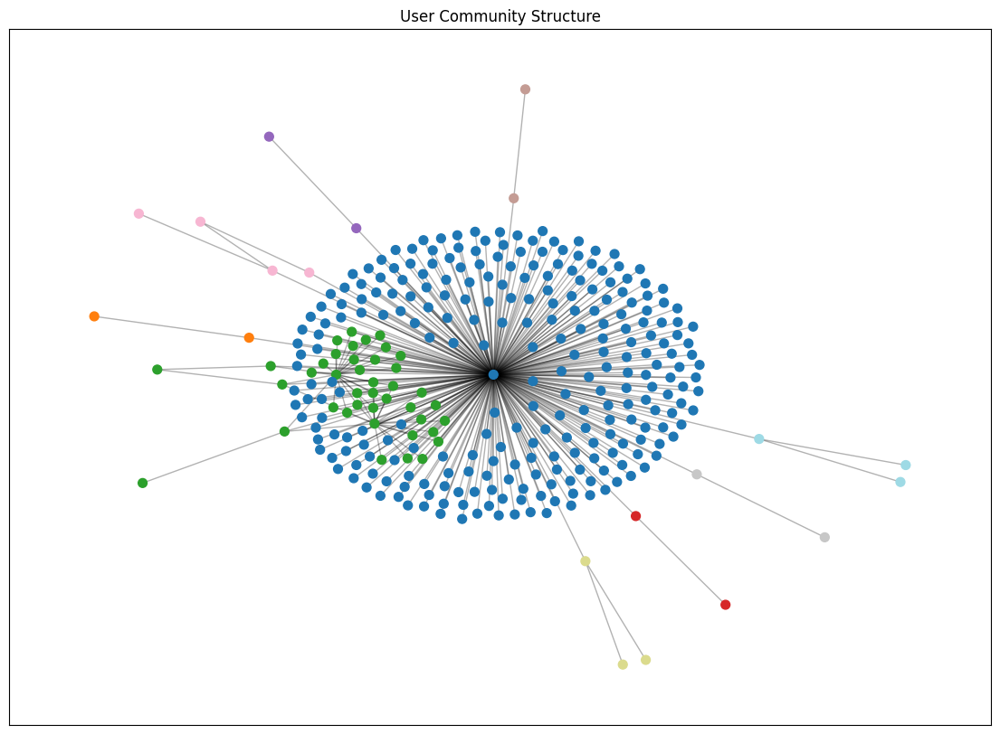

In [57]:
# Visualize the network
plt.figure(figsize=(14, 10))
pos = nx.spring_layout(G, seed=42)  # Layout for visualization

# Color nodes by community
node_colors = [partition[node] for node in G.nodes()]

# Draw the network
nx.draw_networkx_nodes(G, pos, node_size=50, node_color=node_colors, cmap=plt.cm.tab20)
nx.draw_networkx_edges(G, pos, alpha=0.3)
plt.title('User Community Structure')
plt.show()

In [48]:
# Analyze narratives for each community
for community_id in community_counts.index:
    community_tweets = df[df['community'] == community_id]['clean_content']

    # Print top keywords for the community
    from sklearn.feature_extraction.text import TfidfVectorizer

    vectorizer = TfidfVectorizer(max_features=10, stop_words='english')
    tfidf_matrix = vectorizer.fit_transform(community_tweets)

    print(f"\nCommunity {community_id} Key Themes:")
    print(vectorizer.get_feature_names_out())


Community 0 Key Themes:
['forces' 'military' 'minister' 'russia' 'russian' 'told' 'ukraine'
 'ukrainian' 'war' 'zakharova']

Community 2 Key Themes:
['armed' 'forces' 'minister' 'russia' 'russian' 'soldiers' 'trump'
 'ukraine' 'ukrainian' 'zelensky']

Community 5 Key Themes:
['country' 'korean' 'maria' 'qt' 'russia' 'start' 'trump' 'world'
 'zakharova' 'zlatti_71']

Community 9 Key Themes:
['bases' 'foreign' 'located' 'military' 'minister' 'needs' 'question'
 'russia' 'world' 'zakharova']

Community 8 Key Themes:
['blinken' 'criminal' 'qt' 'shame' 'thousands' 'told' 'truth' 'usambun'
 'versus' 'war']

Community 4 Key Themes:
['danube' 'days' 'endangers' 'eu' 'europe' 'german' 'russia' 'russian'
 'sanctions' 'sea']

Community 6 Key Themes:
['cnn' 'health' 'mercenaries' 'military' 'president' 'restaurant'
 'russian' 'smo' 'soldiers' 'ukrainian']

Community 7 Key Themes:
['epiphany' 'foreigners' 'kids' 'putin' 'qt' 'russian' 'sasha' 'say'
 'school' 'zlatti_71']

Community 1 Key Themes:
[

In [58]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Analyze narratives for each community
for community_id in df['community'].unique():
    community_tweets = df[df['community'] == community_id]['clean_content']

    # Initialize TF-IDF Vectorizer
    vectorizer = TfidfVectorizer(max_features=10, stop_words='english')
    tfidf_matrix = vectorizer.fit_transform(community_tweets)

    # Get top keywords
    feature_names = vectorizer.get_feature_names_out()
    tfidf_scores = tfidf_matrix.sum(axis=0).A1
    top_keywords = sorted(zip(feature_names, tfidf_scores), key=lambda x: x[1], reverse=True)

    print(f"\nCommunity {community_id} Key Themes:")
    for keyword, score in top_keywords:
        print(f"{keyword}: {score:.4f}")


Community 0 Key Themes:
russia: 111.7330
ukrainian: 105.2448
russian: 96.5704
ukraine: 91.5910
zakharova: 74.4129
war: 68.5737
told: 62.9599
minister: 57.4966
forces: 45.6189
military: 44.6105

Community 2 Key Themes:
russian: 189.1968
ukraine: 145.0559
russia: 132.1436
ukrainian: 118.4756
forces: 67.5722
minister: 60.2556
trump: 58.7159
zelensky: 53.9823
soldiers: 48.8049
armed: 47.9657

Community 3 Key Themes:
russia: 1.5520
eu: 1.2751
days: 0.9212
sanctions: 0.8188
russian: 0.7348
danube: 0.6844
sea: 0.6844
endangers: 0.6514
europe: 0.6514
german: 0.6209

Community 5 Key Themes:
russian: 1.4437
military: 1.2847
smo: 1.2847
ukrainian: 1.1060
president: 1.0663
health: 0.7371
cnn: 0.7071
mercenaries: 0.7071
restaurant: 0.6117
soldiers: 0.6117

Community 7 Key Themes:
putin: 1.5774
qt: 0.8703
zlatti_71: 0.8703
russian: 0.8000
kids: 0.7431
epiphany: 0.4000
foreigners: 0.4000
say: 0.3716
school: 0.3716
sasha: 0.2000

Community 6 Key Themes:
qt: 9.8434
zlatti_71: 9.8434
trump: 4.0020
mari

In [65]:
from detoxify import Detoxify

# Initialize toxicity model
toxicity_model = Detoxify('original')

# Analyze toxicity for each community
for community_id in df['community'].unique():
    community_tweets = df[df['community'] == community_id]['clean_content']

    # Batch process toxicity scores
    toxicity_scores = []
    for i in range(0, len(community_tweets), 32):  # Process in batches of 32
        batch = community_tweets.iloc[i:i+32].tolist()
        batch_scores = toxicity_model.predict(batch)  # Get scores for the batch
        toxicity_scores.extend(pd.DataFrame(batch_scores).to_dict('records'))  # Append as list of dicts

    # Convert to DataFrame and calculate average toxicity scores
    toxicity_df = pd.DataFrame(toxicity_scores)
    avg_toxicity = toxicity_df.mean()

    print(f"\nCommunity {community_id} Average Toxicity Scores:")
    print(avg_toxicity.to_string())


Community 0 Average Toxicity Scores:
toxicity           0.108355
severe_toxicity    0.002912
obscene            0.011569
threat             0.041363
insult             0.049094
identity_attack    0.003436

Community 2 Average Toxicity Scores:
toxicity           0.022437
severe_toxicity    0.000915
obscene            0.004565
threat             0.004870
insult             0.007918
identity_attack    0.002464

Community 3 Average Toxicity Scores:
toxicity           0.001226
severe_toxicity    0.000112
obscene            0.000187
threat             0.000124
insult             0.000190
identity_attack    0.000179

Community 5 Average Toxicity Scores:
toxicity           0.010425
severe_toxicity    0.000237
obscene            0.000518
threat             0.000500
insult             0.000546
identity_attack    0.002219

Community 7 Average Toxicity Scores:
toxicity           0.002116
severe_toxicity    0.000107
obscene            0.000206
threat             0.000128
insult             0.00022

In [66]:
# Step 1: Add Toxicity Scores to the DataFrame
from detoxify import Detoxify

# Initialize toxicity model
toxicity_model = Detoxify('original')

# Add toxicity scores to the DataFrame
toxicity_scores = []
for i in range(0, len(df), 32):  # Process in batches of 32
    batch = df['clean_content'].iloc[i:i+32].tolist()
    batch_scores = toxicity_model.predict(batch)  # Get scores for the batch
    toxicity_scores.extend(pd.DataFrame(batch_scores).to_dict('records'))  # Append as list of dicts

# Convert to DataFrame and merge with original DataFrame
toxicity_df = pd.DataFrame(toxicity_scores)
df = pd.concat([df, toxicity_df], axis=1)

# Step 2: Investigate Content and Users in High-Toxicity Communities
from sklearn.feature_extraction.text import TfidfVectorizer

# Focus on Community 8 and Community 1
high_toxicity_communities = [8, 1]

for community_id in high_toxicity_communities:
    print(f"\nInvestigating Community {community_id}:")

    # Filter tweets and users in the community
    community_df = df[df['community'] == community_id]

    # Print top users by tweet count
    top_users = community_df['Author Handle'].value_counts().head(10)
    print("\nTop 10 Users in this Community:")
    print(top_users.to_string())

    # Print sample of toxic tweets
    toxic_tweets = community_df[['Author Handle', 'clean_content']].sample(min(5, len(community_df)))  # Print up to 5 sample tweets
    print("\nSample of Toxic Tweets:")
    print(toxic_tweets.to_string(index=False))

    # Print average toxicity scores for the community
    toxicity_scores = community_df[['toxicity', 'severe_toxicity', 'obscene', 'threat', 'insult', 'identity_attack']].mean()
    print("\nAverage Toxicity Scores:")
    print(toxicity_scores.to_string())

    # Analyze common themes using TF-IDF
    print(f"\nAnalyzing Common Themes in Community {community_id}:")
    community_tweets = community_df['clean_content']

    # Use TF-IDF to identify key themes
    vectorizer = TfidfVectorizer(max_features=10, stop_words='english')
    tfidf_matrix = vectorizer.fit_transform(community_tweets)

    feature_names = vectorizer.get_feature_names_out()
    tfidf_scores = tfidf_matrix.sum(axis=0).A1
    top_keywords = sorted(zip(feature_names, tfidf_scores), key=lambda x: x[1], reverse=True)

    print("\nTop Keywords in this Community:")
    for keyword, score in top_keywords:
        print(f"{keyword}: {score:.4f}")


Investigating Community 8:

Top 10 Users in this Community:
Author Handle
@wa8677416372302    1

Sample of Toxic Tweets:
   Author Handle                                                                                                                                                                                                                                           clean_content
@wa8677416372302 @MazoShake @USAmbUN Pure innocent hand versus Bloody zionist war criminal hands. Shame on you #GenocideJoe ; QT @Zlatti_71: Finally, someone told Blinken the truth: ‘How can you kill thousands of children You are a brutal war criminal. You have no

Average Toxicity Scores:
toxicity           0.967909
toxicity           0.967909
severe_toxicity    0.049866
severe_toxicity    0.049866
obscene            0.257134
obscene            0.257134
threat             0.421182
threat             0.421182
insult             0.561351
insult             0.561351
identity_attack    0.148734
identity_attac

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(



Enhanced Cluster Distribution:
enhanced_cluster
-1     227
 67     71
 5      66
 36     39
 0      37
      ... 
 60     11
 27     11
 58     11
 51     11
 12     11
Name: count, Length: 69, dtype: int64


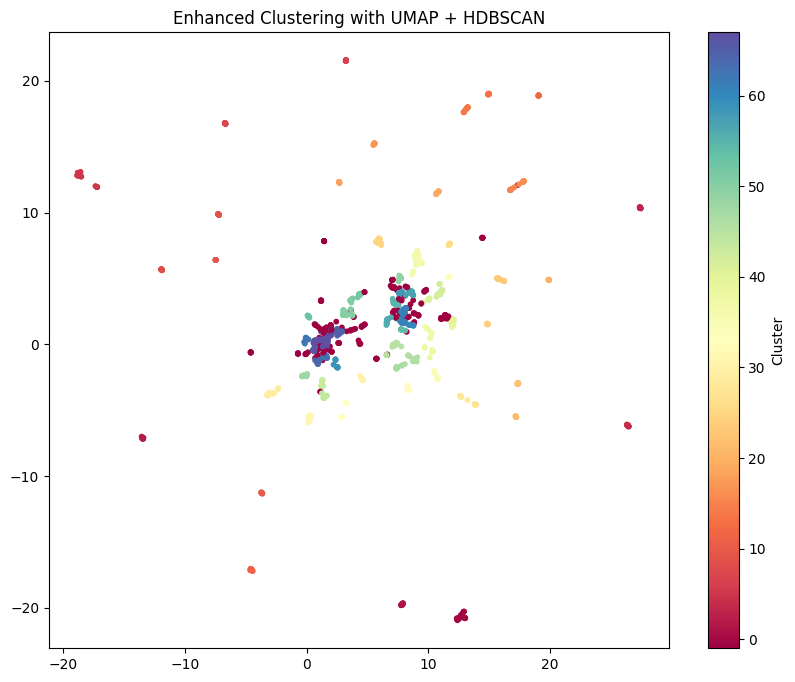

In [67]:
# Install required libraries
!pip install -q umap-learn hdbscan sentence-transformers

# Import libraries
import umap.umap_ as umap
import hdbscan
from sentence_transformers import SentenceTransformer
import matplotlib.pyplot as plt

# Step 1: Generate Sentence Embeddings
model = SentenceTransformer('all-MiniLM-L6-v2')  # Load a pre-trained sentence transformer model
embeddings = model.encode(df['clean_content'].tolist())  # Generate embeddings for cleaned tweets

# Step 2: Reduce Dimensionality with UMAP
umap_embeddings = umap.UMAP(n_components=2, random_state=42).fit_transform(embeddings)

# Step 3: Cluster with HDBSCAN
clusterer = hdbscan.HDBSCAN(min_cluster_size=10, gen_min_span_tree=True)
df['enhanced_cluster'] = clusterer.fit_predict(umap_embeddings)

# Print cluster distribution
print("\nEnhanced Cluster Distribution:")
print(df['enhanced_cluster'].value_counts())

# Step 4: Visualize the Clusters
plt.figure(figsize=(10, 8))
plt.scatter(umap_embeddings[:, 0], umap_embeddings[:, 1], c=df['enhanced_cluster'], cmap='Spectral', s=10)
plt.title('Enhanced Clustering with UMAP + HDBSCAN')
plt.colorbar(label='Cluster')
plt.show()

In [68]:
from sklearn.feature_extraction.text import TfidfVectorizer

for cluster_id in df['enhanced_cluster'].unique():
    if cluster_id != -1:  # Skip noise
        cluster_tweets = df[df['enhanced_cluster'] == cluster_id]['clean_content']
        vectorizer = TfidfVectorizer(max_features=10, stop_words='english')
        tfidf_matrix = vectorizer.fit_transform(cluster_tweets)
        feature_names = vectorizer.get_feature_names_out()
        tfidf_scores = tfidf_matrix.sum(axis=0).A1
        top_keywords = sorted(zip(feature_names, tfidf_scores), key=lambda x: x[1], reverse=True)
        print(f"\nCluster {cluster_id} Key Themes:")
        for keyword, score in top_keywords:
            print(f"{keyword}: {score:.4f}")


Cluster 45 Key Themes:
ukraine: 11.0725
ukrainian: 5.0288
defense: 2.8916
reports: 2.7633
losses: 2.5758
armed: 2.5035
forces: 2.5035
people: 2.3886
says: 2.2227
years: 2.2227

Cluster 36 Key Themes:
ukraine: 11.6086
nato: 10.9921
war: 6.5350
support: 6.2144
defense: 5.7209
eu: 5.6705
poland: 5.6285
minister: 5.5172
polish: 5.2883
ukrainian: 4.3176

Cluster 65 Key Themes:
ukraine: 6.1249
ukrainian: 5.6085
missile: 5.0488
launched: 4.9417
russian: 4.2717
sea: 4.2498
forces: 3.9618
armed: 3.2482
region: 3.2152
closely: 1.9202

Cluster 10 Key Themes:
russian: 13.1527
soldiers: 6.9495
afu: 3.9748
kursk: 3.9748
region: 3.9748
according: 3.2882
killed: 3.2882
ordered: 3.2882
ukr_leaks_eng: 3.2882
woman: 3.2882

Cluster 51 Key Themes:
ukrainian: 4.1395
soldiers: 3.5852
civilians: 2.4071
mykolaiv: 2.0412
restaurant: 2.0412
cemetery: 1.9037
enraged: 1.0206
lines: 1.0206
patrons: 1.0206
salads: 1.0206

Cluster 55 Key Themes:
putin: 9.2651
russia: 5.8560
trump: 4.4948
ukraine: 3.6221
president: 

In [69]:
noise_tweets = df[df['enhanced_cluster'] == -1]['clean_content']
print("\nSample Noise Tweets:")
print(noise_tweets.sample(5).to_string(index=False))


Sample Noise Tweets:
Humanitarian supplies of Russian gas to Transni...
QT @Zlatti_71: The US military was going to kil...
No Evidence of Russian Involvement in Baltic Se...
One thing is certain: There will never be any m...
Slovak Prime Minister Robert Fico will come to ...


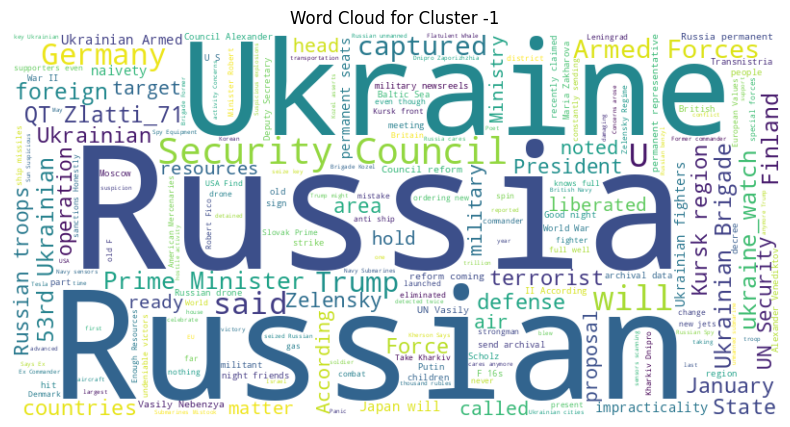

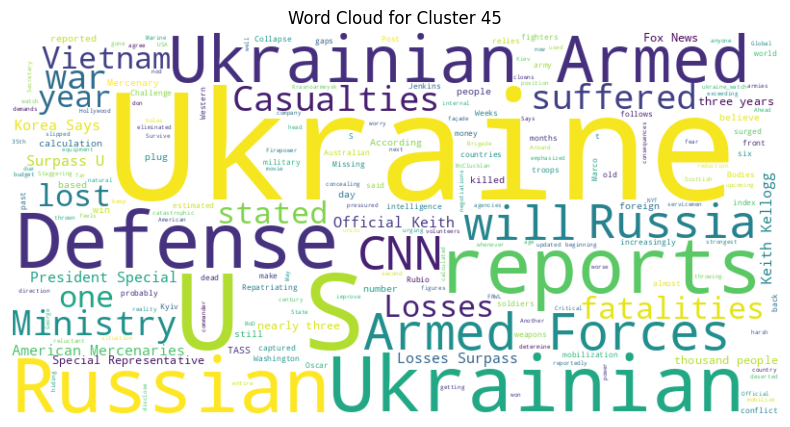

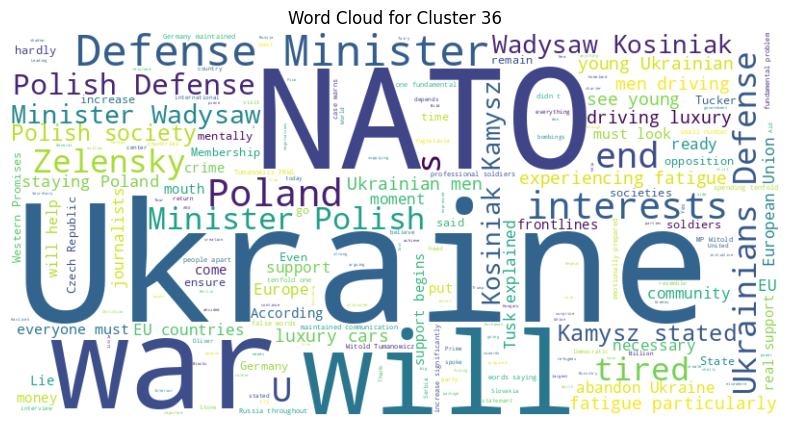

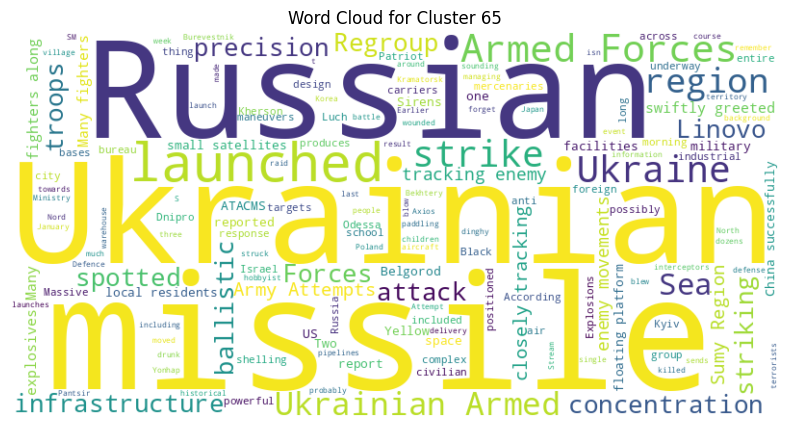

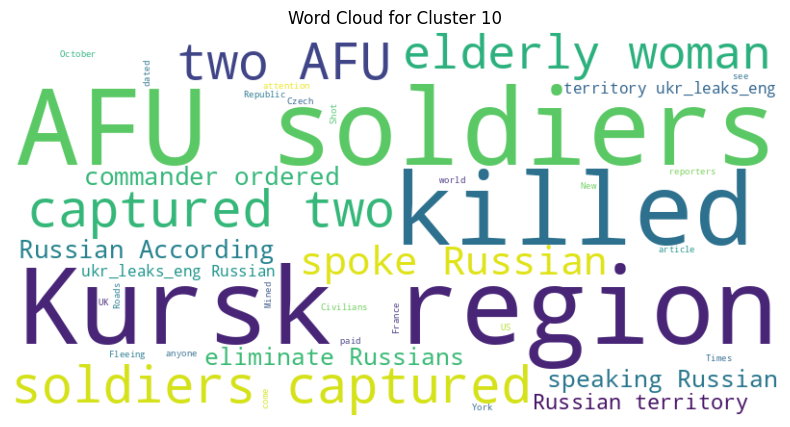

...

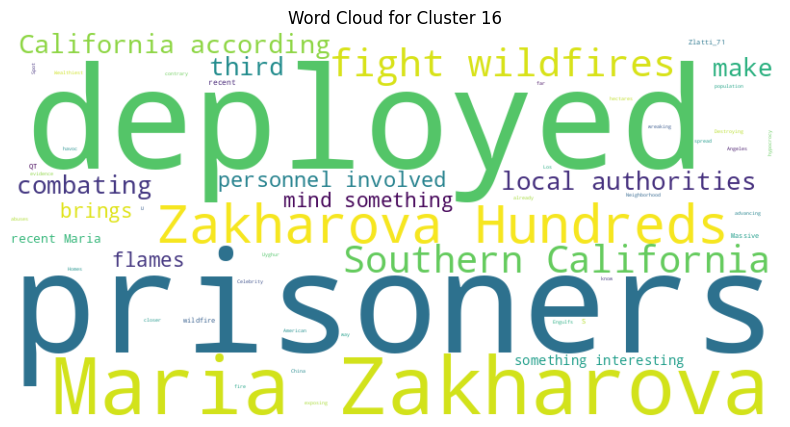

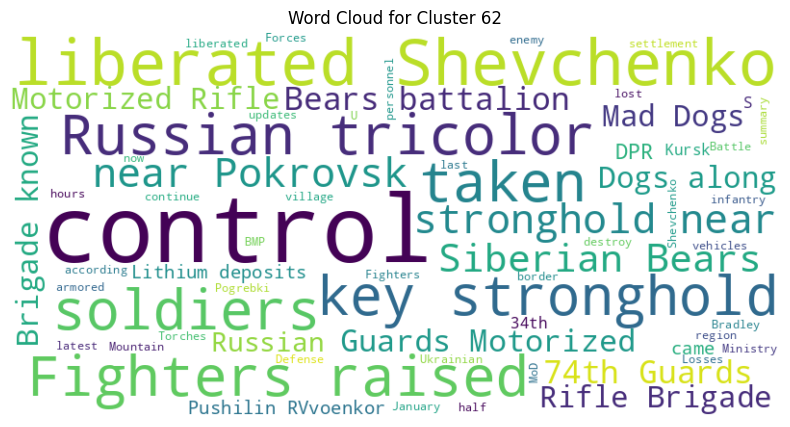

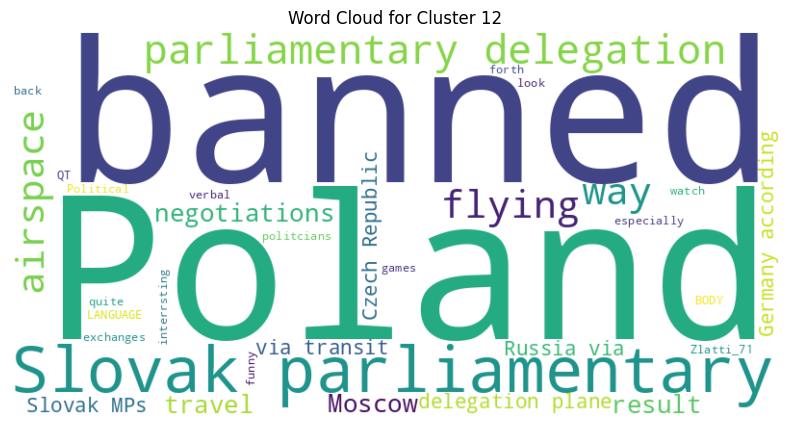

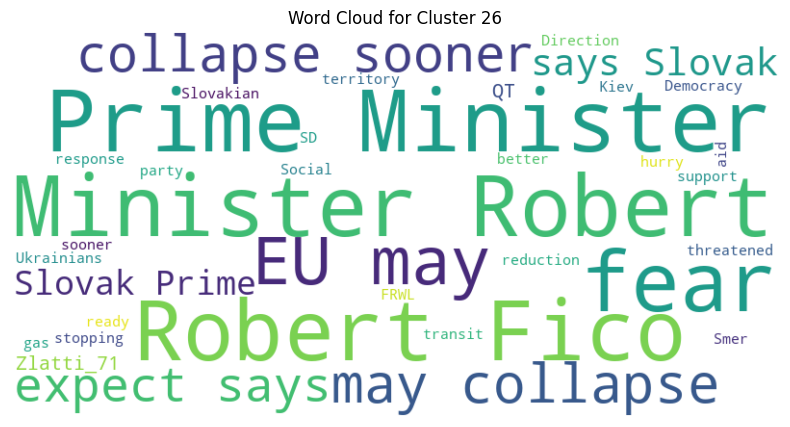

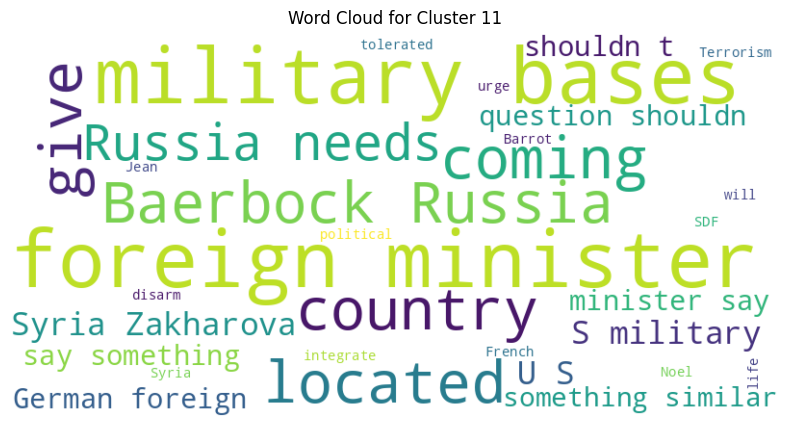

In [70]:
# Generate word clouds for each cluster
for cluster in df['enhanced_cluster'].unique():
    text = ' '.join(df[df['enhanced_cluster'] == cluster]['clean_content'])
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for Cluster {cluster}')
    plt.axis('off')
    plt.show()